#### Michelson interferometry

We see how interference is able to measure `very small` changes in `distance`

In [ ]:
import sympy as smp
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Rectangle, Ellipse, Circle
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.ticker import FuncFormatter

np.random.seed(42)
np.set_printoptions(formatter={'float': '{: 0.4f}'.format})
plt.style.use('dark_background')

In [ ]:
def michelson_interferometer(ax, title):

    # add beam splitter
    ax.plot([-1, 1], [-1, 1], 'w', linewidth=2)

    # add top mirror
    ax.plot([-1, 1], [2, 2], 'w', linewidth=2,zorder=5)

    # add side mirror
    ax.plot([2, 2], [-1, 1], 'w', linewidth=2,zorder=5)

    # add screen
    ax.plot([-2, 2], [-2.5, -2.5], 'w', linewidth=2,zorder=5)

    # incoming ray
    ax.plot([-3, 2], [0.05, 0.05], 'r', linewidth=2)
    ax.plot([0.05, 0.05], [0.05, 2], 'r', linewidth=2)

    # reflected ray
    ax.plot([-0.08, -0.08], [2, -2.5], 'r', linewidth=2, alpha=0.5)
    ax.plot([2, -0.02], [-0.02, -0.02], 'r', linewidth=2, alpha=0.5)
    ax.plot([0, 0], [0, -2.5], 'r', linewidth=2, alpha=0.5)

    ax.arrow(-2, 0.05, 0.001, 0,  head_width=0.15, head_length=0.3, fc='y', ec='none',zorder=5)
    ax.arrow(1, 0.05, 0.001, 0,  head_width=0.15, head_length=0.3, fc='y', ec='none',zorder=5)
    ax.arrow(0.05, 1, 0, 0,  head_width=0.15, head_length=0.3, fc='y', ec='none',zorder=5)

    ax.arrow(0.5, -0.02, -0.001, 0,  head_width=0.15, head_length=0.3, fc='lime', ec='none',zorder=5)
    ax.arrow(-0.08, 0.5, 0, -0.001,  head_width=0.15, head_length=0.3, fc='lime', ec='none',zorder=5)
    ax.arrow(-0.08, -1, 0, -0.001,  head_width=0.15, head_length=0.3, fc='lime', ec='none',zorder=5)
    ax.arrow(0.02, -1, 0, -0.001,  head_width=0.15, head_length=0.3, fc='lime', ec='none',zorder=5)

    # delta L
    ax.plot([2, 3], [-0.5, -0.5], 'w', linewidth=1)
    ax.plot([3, 3], [-0.3, -0.7], 'w', linewidth=1)
    ax.arrow(3-0.3, -0.5, 0.001, 0,  head_width=0.15, head_length=0.3, fc='w', ec='none',zorder=5)
    ax.arrow(2+0.3, -0.5, -0.001, 0,  head_width=0.15, head_length=0.3, fc='w', ec='none',zorder=5)
    ax.text(2.5, -1, r'$\Delta L$', horizontalalignment='center', verticalalignment='center', fontsize=12, color='w')

    ax.set_xlim(-4, 4)
    ax.set_ylim(-3, 2.5)
    ax.set_aspect('equal', adjustable='box')
    ax.set_xlabel('z')
    ax.set_ylabel('x')
    # ax.legend()

    # ax.grid(True)
    ax.axis('off')
    if title:
        ax.set_title(title, fontsize=12)

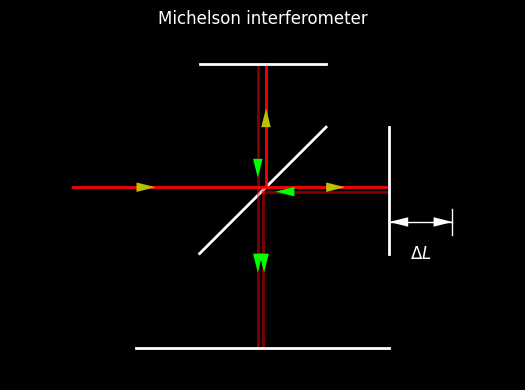

In [ ]:
fig_1, ax_1 = plt.subplots(figsize=(8,4))
michelson_interferometer(ax_1, title='Michelson interferometer')

plt.tight_layout()
plt.show()

In a `Michelson interferometer`, a beam is split into two different paths with a `beam splitter`, and then both beams are reflected by a mirror so that they are recombined and interfere with each other

At initial setup, both mirrors are placed at equal distance to the beam splitter, and the side mirror is able to move laterally for $\Delta L$

For an incoming `plane wave`, if the distance the beam travels to hit the top mirror and then the screen is $z$, then, the distance another beam travels to hit the side mirror then the screen is

$$z+\Delta z = z+2\Delta L$$

We can use plane wave equation to write out the intensity at the screen as

$$\begin{align}
I&=|e^{ikz}+e^{ik(z+\Delta z)}|^2\\
&=\left(e^{ikz}+e^{ik(z+\Delta z)}\right)\cdot \left(e^{-ikz}+e^{-ik(z+\Delta z)}\right)\\
&=2+e^{ik\Delta z}+e^{-ik\Delta z}\\
&=2+2\cos\left(k\Delta z\right)\\
&=\boxed{2+2\cos\left(\frac{2\pi}{\lambda}\Delta z\right)}
\end{align}$$

As a result, constructive interference occurs if

$$\Delta z=m\cdot\lambda$$

and destructive interference occurs if

$$\Delta z=\left(m+\frac{1}{2}\right)\cdot\lambda$$

In [ ]:
class MichelsonInterferometerStraight:
    def __init__(self, wavelength_color='red'):
        self.wavelength_dict = {
            'red': 6.9e-7,
            'orange': 6.1e-7,
            'yellow': 5.8e-7,
            'green': 5.3e-7,
            'cyan': 4.9e-7,
            'blue': 4.7e-7
        }
        self.color_dict = {
            'red': 'red',
            'orange': 'orange',
            'yellow': 'yellow',
            'green': 'green',
            'cyan': 'cyan',
            'blue': 'blue'
        }
        self.wavelength_color = wavelength_color
        self.wavelength = self.wavelength_dict[wavelength_color]
        self.cbar = None

    def straight_beam_intensity(self, delta_z):
        return 2 + 2 * np.cos(2 * np.pi * delta_z / self.wavelength)

    def create_custom_cmap(self, base_color):
        self.base_color_rgb = np.array(plt.cm.colors.to_rgb(base_color))
        self.colors = [(0, 0, 0, i) for i in np.linspace(0, 1, 256)]
        for i in range(256):
            self.colors[i] = tuple((i / 255) * self.base_color_rgb)
        return mcolors.LinearSegmentedColormap.from_list('custom_cmap', self.colors, N=256)


    def straight_beam_pattern(self, delta_z):
        self.delta_z = delta_z
        self.intensity = self.straight_beam_intensity(delta_z)

        self.ax.clear()
        self.ax.set_facecolor('black')
        self.beam_radius = 1.5e-3
        self.margin = 1.5
        self.ax.set_xlim(-self.beam_radius*self.margin, self.beam_radius*self.margin)
        self.ax.set_ylim(-self.beam_radius*self.margin, self.beam_radius*self.margin)
        self.ax.set_aspect('equal')

        self.color = np.array(plt.cm.colors.to_rgb(self.color_dict[self.wavelength_color]))
        self.normalized_intensity = self.intensity / 4
        self.beam_color = (1 - self.normalized_intensity) * np.array([0, 0, 0]) + self.normalized_intensity * self.color

        self.circle = plt.Circle((0, 0), self.beam_radius, color=self.beam_color)
        self.ax.add_patch(self.circle)

        self.ax.set_title(
            f'Intensity: {self.intensity:.2f}, Δz: {self.delta_z:.1e} m \n'
            f'λ: {self.wavelength:.1e} m, Δz/λ: {self.delta_z/self.wavelength:.2f}',
                          color='white', horizontalalignment='center')

        if self.cbar is None:
            self.custom_cmap = self.create_custom_cmap(self.color_dict[self.wavelength_color])
            self.norm = plt.Normalize(vmin=0, vmax=4)
            self.sm = plt.cm.ScalarMappable(cmap=self.custom_cmap, norm=self.norm)
            self.sm.set_array([])

            self.cbar = plt.colorbar(self.sm, ax=self.ax, orientation='vertical', fraction=0.046, pad=0.04)
            self.cbar.set_label('Intensity', color='white')
            self.cbar.ax.yaxis.set_tick_params(color='white')
            self.cbar.outline.set_edgecolor('white')
            plt.setp(plt.getp(self.cbar.ax.axes, 'yticklabels'), color='white')

    def update(self, delta_z):
        self.straight_beam_pattern(delta_z)

    def animate(self):
        self.delta_z_values = np.arange(-2 * self.wavelength, 2 * self.wavelength, self.wavelength * 0.1)
        self.fig, self.ax = plt.subplots(figsize=(5, 4))
        ani = FuncAnimation(self.fig, self.update, frames=self.delta_z_values, repeat=True)
        animation_html = HTML(ani.to_jshtml())
        plt.close(self.fig)
        return animation_html

In [ ]:
interferometer = MichelsonInterferometerStraight('blue')
interferometer.animate()

#### Tilted beam interference

If, by adjusting the mirror, one of the beam, while travelling distance that is $\Delta z$ different from the other beam, also arrives at the screen with a `tilted` angle

In [ ]:
def tilted_beam(ax, title):
    # add straight beam
    ax.plot([-4, 0], [-1, -1], 'r', linewidth=2)

    # add tilted beam
    ax.plot([-4, 0], [0, -0.75], 'r', linewidth=2,zorder=5)

    # add screen
    ax.plot([0, 0], [0.25, -1.25], 'w', linewidth=2,zorder=5)

    ax.plot([-4, -4], [-1.25, -0.75], 'w', linewidth=1,zorder=5)
    ax.plot([-4.5, -4.5], [-1.25, -0.75], 'w', linewidth=1,zorder=5)
    ax.plot([-4.5, -4], [-1, -1], 'w', linewidth=1,zorder=5)
    ax.arrow(-4-0.2, -1, 0.001, 0,  head_width=0.1, head_length=0.2, fc='w', ec='none',zorder=5)
    ax.arrow(-4.5+0.2, -1, -0.001, 0,  head_width=0.1, head_length=0.2, fc='w', ec='none',zorder=5)
    ax.text(-4.25, -1.25, r'$\Delta z$', horizontalalignment='center', verticalalignment='center', fontsize=12, color='w')

    ax.plot([-4, -3], [0,0], 'w--', linewidth=1,zorder=5)
    alpha = Arc([-4,0], 1.2, 1.2, theta1=np.rad2deg(-np.arctan2(0.75, 4)), theta2=0, color='w')
    ax.add_patch(alpha)
    ax.text(-4+np.cos(np.arctan2(0.75, 4)/2),-np.sin(np.arctan2(0.75, 4)/2),  r'$\alpha$', horizontalalignment='center', verticalalignment='center', fontsize=12, color='w')

    ax.arrow(-1, -1, 0.001, 0,  head_width=0.1, head_length=0.2, fc='w', ec='none',zorder=5)
    ax.arrow(-4, 0, 1*3, -1*0.75*3/4,  head_width=0.1, head_length=0.2, fc='w', ec='none',zorder=5)

    ax.set_xlim(-5, 1)
    ax.set_ylim(-1.5, 0.5)
    ax.set_aspect('equal', adjustable='box')
    ax.set_xlabel('z')
    ax.set_ylabel('x')
    # ax.legend()

    # ax.grid(True)
    # ax.axis('off')
    if title:
        ax.set_title(title, fontsize=12)


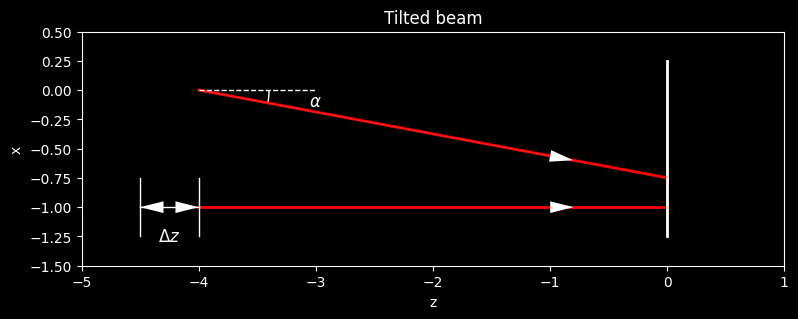

In [ ]:
fig_3, ax_3 = plt.subplots(figsize=(8,4))
tilted_beam(ax_3, title='Tilted beam')

plt.tight_layout()
plt.show()

For example, angle is tilted towards negative direction w.r.t. $z+$ direction

So, the straight bean has the expression at the screen

$$e^{ik(z+\Delta z)}$$

and the tilted beam at the screen is expressed as

$$e^{ik(-x\sin{\alpha}+z\cos{\alpha})}$$

We compute the intensity at the screen (at $z=0$) as

$$\begin{align}
I&=|e^{ik(-x\sin{\alpha})}+e^{ik(\Delta z)}|^2\\
&=\left(e^{ik(-x\sin{\alpha})}+e^{ik(\Delta z)}\right)\cdot \left(e^{ik(x\sin{\alpha})}+e^{-ik(\Delta z)}\right)\\
&=2+e^{ik(x\sin\alpha+\Delta z)}+e^{-ik(x\sin\alpha+\Delta z)}\\
&=\boxed{2+2\cos k\left(x\sin \alpha+\Delta z\right)}
\end{align}$$

Here

* for different $\Delta z$, we get the `phase 0` of the pattern corresponding to the fixed $\Delta z$ at $x\sin \alpha=-\Delta z$, indicating the whole pattern shifts as $\Delta z$ changes when $\alpha$ is fixed
* for different $\alpha$, the whole pattern in $x$ direction has a `period` of

$$\Delta x=\boxed{\frac{\lambda}{\sin \alpha}}$$

In [ ]:
class MichelsonInterferometerTilted:
    def __init__(self, wavelength_color='red'):
        self.wavelength_dict = {
            'red': 6.9e-7,
            'orange': 6.1e-7,
            'yellow': 5.8e-7,
            'green': 5.3e-7,
            'cyan': 4.9e-7,
            'blue': 4.7e-7
        }
        self.color_dict = {
            'red': 'red',
            'orange': 'orange',
            'yellow': 'yellow',
            'green': 'green',
            'cyan': 'cyan',
            'blue': 'blue'
        }
        self.wavelength_color = wavelength_color
        self.wavelength = self.wavelength_dict[wavelength_color]
        self.k = 2 * np.pi / self.wavelength
        self.cbar = None
        self.beam_radius = 1.5e-4
        self.x = np.linspace(-self.beam_radius, self.beam_radius, 1000)  # x values in meters
        self.y = np.linspace(-self.beam_radius, self.beam_radius, 1000)  # y values in meters
        self.X, self.Y = np.meshgrid(self.x, self.y)
          # Beam radius in meters

    def tilted_beam_intensity(self, delta_z, alpha):
        return 2 + 2 * np.cos(self.k * (self.X * np.sin(alpha) + delta_z))

    def create_custom_cmap(self, base_color):
        self.base_color_rgb = np.array(plt.cm.colors.to_rgb(base_color))
        self.colors = [(0, 0, 0, i) for i in np.linspace(0, 1, 256)]
        for i in range(256):
            self.colors[i] = tuple((i / 255) * self.base_color_rgb)
        return mcolors.LinearSegmentedColormap.from_list('custom_cmap', self.colors, N=256)

    def tilted_beam_pattern(self, delta_z, alpha):
        self.intensity = self.tilted_beam_intensity(delta_z, alpha)

        # Create a circular mask
        self.mask = np.sqrt(self.X**2 + self.Y**2) <= self.beam_radius
        self.intensity[~self.mask] = 0  # Mask the area outside the beam

        self.ax.clear()
        self.margin = 1
        self.ax.set_facecolor('black')
        self.ax.set_xlim(-self.beam_radius*self.margin, self.beam_radius*self.margin)
        self.ax.set_ylim(-self.beam_radius*self.margin, self.beam_radius*self.margin)
        self.ax.set_aspect('equal')

        self.color = np.array(plt.cm.colors.to_rgb(self.color_dict[self.wavelength_color]))
        self.custom_cmap = self.create_custom_cmap(self.color_dict[self.wavelength_color])

        self.img = self.ax.imshow(self.intensity, cmap=self.custom_cmap, extent=(-self.beam_radius, self.beam_radius, -self.beam_radius, self.beam_radius), origin='lower')
        self.phase_zero = (-delta_z)/np.sin(alpha)
        self.second_maxima = (2*self.wavelength-delta_z)/np.sin(alpha)
        self.fourth_maxima_maxima = (4*self.wavelength-delta_z)/np.sin(alpha)

        self.ax.set_title(
            f'Δz: {delta_z:.1e} m, α: {np.rad2deg(alpha):.1f}°, λ: {self.wavelength:.1e} m, period: {self.wavelength/np.sin(alpha):.1e} m \n'
            f'phase zero: {self.phase_zero:.1e} m, 2nd max {self.second_maxima:.1e} m, 4th max: {self.fourth_maxima_maxima:.1e} m \n'
            f'Δz changed: {(delta_z-self.wavelength):.1e}  pattern shifted (in λ): {(delta_z-self.wavelength)/self.wavelength:.1f}',
                          color='white',
                          horizontalalignment='center'
                          )
        self.ax.plot([self.phase_zero,self.phase_zero],[-self.beam_radius,self.beam_radius],'-')
        self.ax.plot([self.second_maxima,self.second_maxima],[-self.beam_radius,self.beam_radius],'--')
        self.ax.plot([self.fourth_maxima_maxima,self.fourth_maxima_maxima],[-self.beam_radius,self.beam_radius],'-.')

        if self.cbar is None:
            self.norm = plt.Normalize(vmin=0, vmax=4)
            self.sm = plt.cm.ScalarMappable(cmap=self.custom_cmap, norm=self.norm)
            self.sm.set_array([])

            self.cbar = plt.colorbar(self.sm, ax=self.ax, orientation='vertical', fraction=0.046, pad=0.04)
            self.cbar.set_label('Intensity', color='white')
            self.cbar.ax.yaxis.set_tick_params(color='white')
            self.cbar.outline.set_edgecolor('white')
            plt.setp(plt.getp(self.cbar.ax.axes, 'yticklabels'), color='white')

    def update_delta_z(self, delta_z):
        self.tilted_beam_pattern(delta_z, self.alpha)

    def update_alpha(self, alpha):
        self.tilted_beam_pattern(self.delta_z, alpha)

    def animate_delta_z(self):
        self.alpha = 0.1  # Fixed alpha in radians
        self.delta_z_values = np.arange(self.wavelength, 3 * self.wavelength, self.wavelength * 0.1)
        self.fig, self.ax = plt.subplots(figsize=(7, 6))
        ani = FuncAnimation(self.fig, self.update_delta_z, frames=self.delta_z_values, repeat=True)
        animation_html = HTML(ani.to_jshtml())
        plt.close(self.fig)
        return animation_html

    def animate_alpha(self):
        self.delta_z = self.wavelength  # Fixed delta_z
        self.alpha_values = np.arange(0.01, 0.1, 0.005)  # Alpha range in radians
        self.fig, self.ax = plt.subplots(figsize=(6, 6))
        ani = FuncAnimation(self.fig, self.update_alpha, frames=self.alpha_values, repeat=True)
        animation_html = HTML(ani.to_jshtml())
        plt.close(self.fig)
        return animation_html

In [ ]:
interferometer_tilted = MichelsonInterferometerTilted(wavelength_color='red')

In [ ]:
# Animation with fixed alpha and changing delta_z
animation_delta_z = interferometer_tilted.animate_delta_z()
display(animation_delta_z)

In [ ]:
# Animation with fixed delta_z and changing alpha
animation_alpha = interferometer_tilted.animate_alpha()
display(animation_alpha)

#### Haidinger pattern

Finally, what if `both beams` are tilted by a small $\alpha$, and these parallel lines are collected by a `lens` onto the screen?

In [ ]:
def haidinger_setup(ax, title=None, title_loc='center', fontsize=12):
    # Optical axis
    ax.plot([-1.2, 1.2], [0, 0], 'w', linewidth=2)

    # Distances
    d = 0.05
    f = 0.4

    # y1 and arrows
    ax.plot([f, f], [0, -f/2], 'c', linewidth=2, zorder=5)
    ax.arrow(f, -f/2+0.1, 0,-0.001,   head_width=0.07, head_length=0.1, fc='c', ec='none')
    ax.text(f+0.1, -f/3, r'$r$', horizontalalignment='center', verticalalignment='center', fontsize=fontsize, color='c')

    # Ray 1 (passing through center)
    ax.plot([-2*f, f],[f, -f/2], 'r', linewidth=2)
    ax.arrow(-f, f/2, 0.001*f, -0.001*f/2,  head_width=0.04, head_length=0.06, fc='w', ec='none', zorder=5)

    # Ray 2 (upper ray)
    ax.plot([0, f],[-f/2,-f/2], 'r', linewidth=2)
    ax.plot([-2*f, 0],[f/2,-f/2], 'r', linewidth=2)
    ax.arrow(-f, 0, 0.001*f, -0.001*f/2,  head_width=0.04, head_length=0.06, fc='w', ec='none', zorder=5)

    # Ray 3 (lower ray)
    ax.plot([0, f],[f/2,-f/2], 'r', linewidth=2)
    ax.plot([-2*f, 0],[f+f/2,f/2], 'r', linewidth=2)
    ax.arrow(-f, f, 0.001*f, -0.001*f/2,  head_width=0.04, head_length=0.06, fc='w', ec='none', zorder=5)

    # f distance
    ax.plot([0, 0], [0, -0.1], 'w-', linewidth=1)
    ax.plot([0, f], [-0.05, -0.05], 'w-', linewidth=1)
    ax.plot([f, f], [0, -0.1], 'w-', linewidth=1)
    ax.text(f/2, -0.15, r'$f$', horizontalalignment='center', verticalalignment='center', fontsize=fontsize, color='w')
    ax.arrow(0.06, -0.05, -0.001, 0,  head_width=0.04, head_length=0.06, fc='w', ec='none')
    ax.arrow(f-0.06, -0.05, 0.001, 0,  head_width=0.04, head_length=0.06, fc='w', ec='none')

    # Arc and theta
    arc_theta = Arc([0, 0], 0.4, 0.4, theta1=180-np.rad2deg(np.arctan(0.5)), theta2=180, color='w')
    ax.add_patch(arc_theta)
    ax.text(-0.3*np.cos(np.arctan(0.5)/2), 0.3*np.sin(np.arctan(0.5)/2), r'$\alpha$', horizontalalignment='center', verticalalignment='center', fontsize=fontsize, color='w')

    # Lens
    lens = Ellipse((0,0), 0.1, 0.6, edgecolor='none', facecolor='skyblue', zorder=-5)
    ax.add_patch(lens)

    # Set limits and aspect ratio
    ax.set_xlim(-1, 0.8)
    ax.set_ylim(-0.5, 0.7)
    ax.set_aspect('equal')
    ax.grid(True)
    ax.axis('off')

    if title:
        ax.set_title(title, loc=title_loc, fontsize=fontsize)

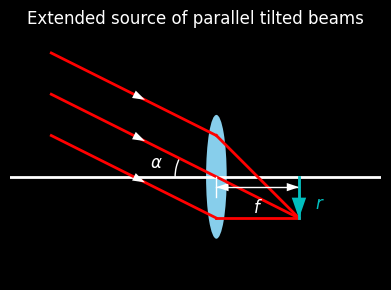

In [ ]:
fig_4, ax_4 = plt.subplots(figsize=(5, 3))

haidinger_setup(ax_4, title='Extended source of parallel tilted beams')

plt.tight_layout()
plt.show()

Now, we `imagine` another extended source emitting these parallel lights at angel $\alpha$, the only difference is that when they arrive at the lens, they traveled an `additional distance` $\Delta z$ (in $z$ direction). This will be achieved, for example, through thin film as will be described in later notebook.

The intensity pattern on the screen from rays emitted from these two sources can be expressed as

$$\begin{align}
I&=|e^{ik(-x\sin{\alpha+z\cos{\alpha}})}+e^{ik(-x\sin{\alpha+(z+\Delta z)\cos{\alpha}})}|^2\\
&=2+e^{ik(\Delta z\cos{\alpha})}+e^{-ik(\Delta z\cos{\alpha})}\\
&=\boxed{2+2\cos \left(k\Delta z \cos{\alpha}\right)}\\
&\approx 2+2\cos \left(k\Delta z \cos{\frac{r}{f}}\right)\, (\text{paraxial})
\end{align}$$

For a particular $\Delta z\neq0$ and $\alpha$, the `largest order of interference` or `number of rings` can be determined as follows

$$k\Delta z \cos{\alpha}=\frac{2\pi}{\lambda}\Delta z \cos{\alpha}=m\cdot 2\pi\leq \frac{2\pi}{\lambda}\Delta z$$

or

$$\boxed{m\leq\frac{\Delta z}{\lambda}}$$

In [ ]:
class HaidingerFringes:
    def __init__(self, wavelength_color='red', focal_length=0.1, figsize=(5,6), range_in_lam=10):
        self.wavelength_dict = {
            'red': 6.9e-7,
            'orange': 6.1e-7,
            'yellow': 5.8e-7,
            'green': 5.3e-7,
            'cyan': 4.9e-7,
            'blue': 4.7e-7
        }
        self.color_dict = {
            'red': 'red',
            'orange': 'orange',
            'yellow': 'yellow',
            'green': 'green',
            'cyan': 'cyan',
            'blue': 'blue'
        }
        self.wavelength_color = wavelength_color
        self.wavelength = self.wavelength_dict[wavelength_color]
        self.k = 2 * np.pi / self.wavelength
        self.focal_length = focal_length
        self.cbar = None
        self.draw_radius = self.focal_length * 10
        self.x = np.linspace(-self.draw_radius, self.draw_radius, 999)  # x values in meters
        self.y = np.linspace(-self.draw_radius, self.draw_radius, 999)  # y values in meters
        self.X, self.Y = np.meshgrid(self.x, self.y)
        self.figsize = figsize
        self.range_in_lam = range_in_lam

    def haidinger_intensity(self, delta_z):
        alpha = np.arctan(np.sqrt(self.X**2 + self.Y**2) / self.focal_length)
        return 2 + 2 * np.cos(self.k * delta_z * np.cos(alpha))

    def haidinger_intensity_1d(self, delta_z):
        alpha = np.arctan(np.abs(self.x) / self.focal_length)
        return 2 + 2 * np.cos(self.k * delta_z * np.cos(alpha))

    def create_custom_cmap(self, base_color):
        base_color_rgb = np.array(plt.cm.colors.to_rgb(base_color))
        colors = [(0, 0, 0, i) for i in np.linspace(0, 1, 256)]
        for i in range(256):
            colors[i] = tuple((i / 255) * base_color_rgb)
        return mcolors.LinearSegmentedColormap.from_list('custom_cmap', colors, N=256)

    def haidinger_pattern(self, delta_z):
        intensity = self.haidinger_intensity(delta_z)

        self.mask = np.sqrt(self.X**2 + self.Y**2) <= self.draw_radius
        intensity[~self.mask] = 0  # use mask trick to force correct intensity display

        self.ax[0].clear()
        self.margin = 1.1
        self.ax[0].set_xlim(-self.draw_radius * self.margin, self.draw_radius * self.margin)
        self.ax[0].set_ylim(-self.draw_radius * self.margin, self.draw_radius * self.margin)
        self.ax[0].set_aspect('equal')
        self.ax[0].set_xlabel('x (m)', color='white')
        self.ax[0].set_ylabel('y (m)', color='white')
        self.ax[0].yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{y:.1f}'))
        self.ax[0].grid(True, alpha=0.2)

        self.color = np.array(plt.cm.colors.to_rgb(self.color_dict[self.wavelength_color]))
        self.custom_cmap = self.create_custom_cmap(self.color_dict[self.wavelength_color])

        self.largest_order = int(delta_z / self.wavelength+0.01)

        self.img = self.ax[0].imshow(intensity, cmap=self.custom_cmap, extent=(-self.draw_radius, self.draw_radius, -self.draw_radius, self.draw_radius), origin='lower')


        first_ring_r = "n/a" if self.largest_order < 1 else f"{np.tan(np.arccos(self.wavelength / delta_z)) * self.focal_length:.2f} m"
        second_ring_r = "n/a" if self.largest_order < 2 else f"{np.tan(np.arccos(2 * self.wavelength / delta_z)) * self.focal_length:.2f} m"
        third_ring_r = "n/a" if self.largest_order < 3 else f"{np.tan(np.arccos(3 * self.wavelength / delta_z)) * self.focal_length:.2f} m"
        fourth_ring_r = "n/a" if self.largest_order < 4 else f"{np.tan(np.arccos(4 * self.wavelength / delta_z)) * self.focal_length:.2f} m"
        self.ax[0].set_title(
            f'Δz: {delta_z:.1e} m, λ: {self.wavelength:.1e} m \n'
            f'Δz/λ (in pi): {delta_z/self.wavelength:.2f}, largest order: {self.largest_order}\n'
            f'1st ring r: {first_ring_r}, 2nd ring r: {second_ring_r}\n'
            f'3rd ring r: {third_ring_r}, 4th ring r: {fourth_ring_r}',
                          color='white',
                          horizontalalignment='center'
                          )

        # # Colorbar configuration
        # if self.cbar is None:
        #     self.norm = plt.Normalize(vmin=0, vmax=4)
        #     self.sm = plt.cm.ScalarMappable(cmap=self.custom_cmap, norm=self.norm)
        #     self.sm.set_array([])

        #     # Create a colorbar axis below ax[0] but above ax[2]
        #     cbar_ax = self.fig.add_axes([0.15, 0.35, 0.7, 0.02])  # [left, bottom, width, height]
        #     self.cbar = plt.colorbar(self.sm, cax=cbar_ax, orientation='horizontal')
        #     self.cbar.set_label('Intensity', color='white')
        #     self.cbar.ax.xaxis.set_tick_params(color='white')
        #     self.cbar.outline.set_edgecolor('white')
        #     plt.setp(plt.getp(self.cbar.ax.axes, 'xticklabels'), color='white')

        # Plotting 1D case
        self.ax[1].clear()
        self.ax[1].set_xlim(-self.draw_radius* self.margin, self.draw_radius* self.margin)
        self.ax[1].set_ylim(0, 4)

        intensity_1d = self.haidinger_intensity_1d(delta_z)
        self.ax[1].plot(self.x, intensity_1d, color=self.color_dict[self.wavelength_color])

        self.ax[1].set_title(f'1D Intensity Profile at y = 0', color='white')
        self.ax[1].set_xlabel('x (meters)', color='white')
        self.ax[1].set_ylabel('Intensity', color='white')
        self.ax[1].yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{y:.2f}'))
        self.ax[1].grid(True, alpha=0.2)

    def update(self, delta_z):
        self.haidinger_pattern(delta_z)

    def animate(self):
        self.delta_z_values = np.arange(0, self.range_in_lam * self.wavelength, self.wavelength * 0.1)
        self.fig, self.ax = plt.subplots(2, 1, figsize=self.figsize, gridspec_kw={'height_ratios': [5, 1]})
        self.fig.subplots_adjust(hspace=0.4)

        self.ani = FuncAnimation(self.fig, self.update, frames=self.delta_z_values, repeat=True)
        self.animation_html = HTML(self.ani.to_jshtml())
        plt.close(self.fig)
        return self.animation_html

In [ ]:
haidinger_fringes = HaidingerFringes(wavelength_color='red', figsize=(5, 7), range_in_lam=8)

In [ ]:
animation = haidinger_fringes.animate()
display(animation)